# Preparation
## Downloading necessary packages

In [859]:
using JuDGE, JuMP, Gurobi, CSV, DataFrames, Chain, Statistics, Plots, DataFramesMeta, StatsPlots

In [860]:
# Alternative version that returns normalized colors (0-1 range)
function create_color_gradient_normalized(color1::Tuple{Float64,Float64,Float64}, 
                                         color2::Tuple{Float64,Float64,Float64}, 
                                         steps::Int=10)
    """
    Create a gradient of colors between two normalized RGB tuples (0-1 range).
    """
    @assert all(0.0 .≤ color1 .≤ 1.0) "color1 values must be between 0.0-1.0"
    @assert all(0.0 .≤ color2 .≤ 1.0) "color2 values must be between 0.0-1.0"
    @assert steps ≥ 2 "Number of steps must be at least 2"
    
    gradient = Vector{RGB{Float64}}()
    
    for i in 0:(steps-1)
        t = i / (steps - 1)
        r = color1[1] + t * (color2[1] - color1[1])
        g = color1[2] + t * (color2[2] - color1[2])
        b = color1[3] + t * (color2[3] - color1[3])
        
        # Clamp to 0-1 range
        r = clamp(r, 0.0, 1.0)
        g = clamp(g, 0.0, 1.0)
        b = clamp(b, 0.0, 1.0)
        
        push!(gradient, RGB(r, g, b))
    end
    
    return gradient
end

create_color_gradient_normalized (generic function with 2 methods)

## Reading csv files

In [861]:

data = CSV.read("degree_hours.csv", DataFrame)
periods = unique(data[!,"period"])
paths =   unique(data[!,"ssp"])

states = []

period = periods[1]
ssp = '-'

println(periods)
println(paths)

CO2_tax = Dict(
    "ssp119" => 200,
    "ssp126" => 150,
    "ssp245" => 100,
    "ssp370" =>  50,
    "ssp585" =>   0
)



# Using Chain for more readable pipeline
result = @chain data begin
    filter(:period => ==(period), _)  # filter first period
    groupby([:quantile,:variable])
    combine(:count => mean => :count)
end

push!(states,Dict(
    :period => period,
    :ssp => "-",
    :degree_hours => result,
    :CO2_tax => 80 #euros per ton
))

for period in periods[2:end]
    for ssp in paths
        # Using Chain for more readable pipeline
        result = @chain data begin
            filter(:period => ==(period), _) 
            filter(:ssp => ==(ssp), _) 
            select(:quantile, :variable, :count)
        end 
        push!(states,Dict(
            :period => period,
            :ssp => ssp,
            :degree_hours => result,
            :CO2_tax => CO2_tax[ssp]
        ))
    end
end
println("ok")
println(length(states))


String15["2021-2031", "2031-2041", "2041-2051", "2051-2061", "2061-2071", "2071-2081", "2081-2091"]
String7["ssp119", "ssp126", "ssp245", "ssp370", "ssp585"]
ok
31


In [862]:
using DataFrames

# Create an empty DataFrame with proper column types
df = DataFrame(
    n = Int[], 
    p = Any[],  # Changed from Any[] to String[] since you're only pushing "-"
    depth = Int[],
    degree = Int[] 
)

for (i, state) in enumerate(states)
    if state[:period] == periods[1]
        println("start")
        push!(df, (n=i, p="-", degree=length(paths), depth=0)) 
    else
        depth = findfirst(x -> x == state[:period], periods) - 1  # Using findfirst instead of findall
        period_prev = periods[depth]

        # Fixed the comparison operator (== instead of =) and added proper conditions
        index = findfirst(x -> x[:period] == period_prev && (state[:ssp] == x[:ssp] || depth == 1), states)
        
        if index === nothing
            error("No matching state found for i=$i")
        end
        
        if state[:period] != periods[end]
            push!(df, (n=i, p=index, degree=2, depth=depth))  
        else
            push!(df, (n=i, p=index, degree=1, depth=depth))
        end
    end
end

CSV.write("Climate_tree.csv",df)

start


"Climate_tree.csv"

In [863]:
df1 = states[1][:degree_hours]
res1 = filter(x -> x["variable"] == "CDH", df1)


Row,quantile,variable,count
,Float64,String3,Float64
1,0.0,CDH,82292.2
2,3.45866e-5,CDH,164.4
3,0.286584,CDH,310.2
4,0.582147,CDH,302.4
5,0.883386,CDH,305.4
6,1.19264,CDH,293.8
7,1.51649,CDH,291.8
8,1.84905,CDH,280.2
9,2.20259,CDH,283.4


In [864]:
mytree, p = tree_from_file("Climate_tree.csv")
JuDGE.print_tree(mytree)

--1
  --2
    --7
      --12
        --17
          --22
            --27
  --3
    --8
      --13
        --18
          --23
            --28
  --4
    --9
      --14
        --19
          --24
            --29
  --5
    --10
      --15
        --20
          --25
            --30
  --6
    --11
      --16
        --21
          --26
            --31


In [865]:
data = Dict( zip( collect(mytree,order=:breadth), states) )

period = Dict( zip(collect(mytree,order=:breadth), [d[:period] for d in states]))
ssp = Dict( zip(collect(mytree,order=:breadth), [d[:ssp] for d in states]))
degree_hour = Dict( zip(collect(mytree,order=:breadth), [d[:degree_hours] for d in states]))
CO2_tax = Dict( zip(collect(mytree,order=:breadth), [d[:CO2_tax] for d in states]))


Dict{AbstractTree, Int64} with 31 entries:
  Leaf node 27                                 => 200
  Subtree rooted at node 23 containing 2 nodes => 150
  Subtree rooted at node 2 containing 6 nodes  => 200
  Subtree rooted at node 24 containing 2 nodes => 100
  Subtree rooted at node 1 containing 31 nodes => 80
  Subtree rooted at node 11 containing 5 nodes => 0
  Subtree rooted at node 21 containing 3 nodes => 0
  Subtree rooted at node 17 containing 3 nodes => 200
  Subtree rooted at node 12 containing 4 nodes => 200
  Subtree rooted at node 15 containing 4 nodes => 50
  Subtree rooted at node 4 containing 6 nodes  => 100
  Subtree rooted at node 10 containing 5 nodes => 50
  Subtree rooted at node 14 containing 4 nodes => 100
  Subtree rooted at node 6 containing 6 nodes  => 0
  Subtree rooted at node 9 containing 5 nodes  => 100
  Subtree rooted at node 20 containing 3 nodes => 50
  Subtree rooted at node 18 containing 3 nodes => 150
  Subtree rooted at node 26 containing 2 nodes =>

In [866]:
JuDGE.print_tree(mytree,ssp)
JuDGE.print_tree(mytree,period)
JuDGE.print_tree(mytree,CO2_tax)

--1 (-)
  --2 (ssp119)
    --7 (ssp119)
      --12 (ssp119)
        --17 (ssp119)
          --22 (ssp119)
            --27 (ssp119)
  --3 (ssp126)
    --8 (ssp126)
      --13 (ssp126)
        --18 (ssp126)
          --23 (ssp126)
            --28 (ssp126)
  --4 (ssp245)
    --9 (ssp245)
      --14 (ssp245)
        --19 (ssp245)
          --24 (ssp245)
            --29 (ssp245)
  --5 (ssp370)
    --10 (ssp370)
      --15 (ssp370)
        --20 (ssp370)
          --25 (ssp370)
            --30 (ssp370)
  --6 (ssp585)
    --11 (ssp585)
      --16 (ssp585)
        --21 (ssp585)
          --26 (ssp585)
            --31 (ssp585)
--1 (2021-2031)
  --2 (2031-2041)
    --7 (2041-2051)
      --12 (2051-2061)
        --17 (2061-2071)
          --22 (2071-2081)
            --27 (2081-2091)
  --3 (2031-2041)
    --8 (2041-2051)
      --13 (2051-2061)
        --18 (2061-2071)
          --23 (2071-2081)
            --28 (2081-2091)
  --4 (2031-2041)
    --9 (2041-2051)
      --14 (2051-2061)
        -

In [882]:
H_assets = [:Geothermal, :Boiler, :HeatPump]
C_assets = [:HeatPump,:Geothermal]


r = 0.12 # K.m2/W
area = 3000 #m2
u = 1/r
U = u * area / 1e6 #MW/deg


Assets_colors = Dict(
    :Geothermal => RGB(0.98, 0.4, 0.02), 
    :HeatPump => RGB(0.01,0.2,0.6), 
    :Boiler => RGB(0.4, 0.4, 0.4)
    
)

# Operational Costs (€/MWh)
# c_operational_cost_H = Dict(
#     :CHP => 30.0,
#     :Boiler => 10.0,
#     :Geothermal => 1.0,
#     :HeatPump => 20.0
# )

# Investment Costs (€/MW)
c_investment_cost_H = Dict(
    :CHP => 1000.0,
    :Geothermal => 1.0e6,
    :Boiler => 1e4,
    :HeatPump => 2e4
)

# Fixed O&M Costs (€/MW per year)
# c_fixed_cost_H = Dict(
#     :CHP => 50.0,
#     :Boiler => 30.0,
#     :Geothermal => 10000.0,
#     :HeatPump => 40.0
# )

# Fixed O&M Costs (€/MW per year)
# lifetime = Dict(
#     :CHP => 3.0,
#     :Boiler => 2.0,
#     :HeatPump => 1.0
# )
# Fixed O&M Costs (€/MW per year)
# delay = Dict(
#     :CHP => 1.0,
#     :Boiler => 1.0,
#     :HeatPump => 1.0,
#     :Geothermal => 4.0,
# )

# Maximum Additional Capacity (MW)
c_max_additional_capacity = Dict(
    :CHP => 1e6,
    :Boiler => 1e6,
    :Boiler2 => 1e6,
    :HeatPump => 1e6,
    :Geothermal => 0.1
)

# Initial Capacities (MW)
c_initial_capacity = Dict(
    :CHP => 25,
    :Boiler => 20,
    :Boiler2 => 1e5,
    :HeatPump => 5,
    :Geothermal => 0,
)

prim = Dict(
    :Boiler => :Gas,
    :Boiler2 => :Gas,
    :CHP => :Gas,
    :HeatPump => :Elec,
    :Geothermal => :Elec
)

primary_cost = Dict(
    :Elec => 350,
    :Gas => 50
)
c_unmet = 1e3

function HP_COP_H(dh)
    return 0.6*(273.15 + 22 + dh)/(2.0*dh+10)
end

function HP_COP_C(dc)
    COP = 0.6*(273.15 + 12)/(dc+10)
    return COP - 1
end

function Geo_COP_H(dh)
    return 0.6*(273.15 + 22 + dh)/(dh+10)
end

function Geo_COP_C(dc)
    COP = 20
    return COP - 1
end


function efficient_CHP(dh)
    return 0.3
end

function efficient_Boiler(dh)
    return 0.9
end


# Efficiency (as a fraction)
efficiency_H = Dict(
    :CHP => efficient_CHP,
    :Boiler => efficient_Boiler,
    :Boiler2 => efficient_Boiler,
    :HeatPump => HP_COP_H,
    :Geothermal => Geo_COP_H
)


# Efficiency (as a fraction)
efficiency_C = Dict(
    :HeatPump => HP_COP_C,
    :Geothermal => Geo_COP_C
)
        

Dict{Symbol, Function} with 2 entries:
  :Geothermal => Geo_COP_C
  :HeatPump   => HP_COP_C

In [1009]:
JuDGE_SP_Solver = optimizer_with_attributes(Gurobi.Optimizer, "OutputFlag" => 0, "MIPGap" => 0.0)
function sub_problems(node)
    sp = Model(JuDGE_SP_Solver)

    CDH = filter(x -> x["variable"] == "CDH", degree_hour[node])
    HDH = filter(x -> x["variable"] == "HDH", degree_hour[node])
    
    nCDH = nrow(CDH)
    nHDH = nrow(HDH)

    @variable(sp, 0<= admin[H_assets] <= 1, Bin)
    
    @variable(sp, 0 <= H_heat_prod[H_assets,1:nHDH])
    @variable(sp, 0 <= H_heat_unmet[1:nHDH])
    @variable(sp, 0 <= C_heat_prod[C_assets,1:nCDH])
    @variable(sp, 0 <= C_heat_unmet[1:nCDH])
    @expansion(sp, 0 <= invest[H_assets] <= 10, lag = 1, duration = 3)
    @constraint(sp, MaxInvest[tech in H_assets], invest[tech] <= c_max_additional_capacity[tech] * admin[tech])

    
    @constraint(sp, MeetingHDemand[h in 1:nHDH], sum(H_heat_prod[tech,h] for tech in H_assets) + H_heat_unmet[h] == U * HDH[h,"quantile"])
    @constraint(sp, MeetingCDemand[h in 1:nCDH], sum(C_heat_prod[tech,h] for tech in C_assets) + C_heat_unmet[h] == U * CDH[h,"quantile"])
    
    @capitalcosts(sp, sum(invest[tech]*c_investment_cost_H[tech] for tech in H_assets))
    
    # @variable(sp, y[1:num_items], Bin)
    
    @constraint(sp, H_max_capa[tech in H_assets, h in 1:nHDH], H_heat_prod[tech,h]/efficiency_H[tech](HDH[h,"quantile"]) <= invest[tech])
    @constraint(sp, C_max_capa[tech in C_assets, h in 1:nHDH], C_heat_prod[tech,h]/efficiency_C[tech](CDH[h,"quantile"]) <= invest[tech])

    @constraint(sp, Geo_balancing, sum(CDH[h,"count"] * C_heat_prod[:Geothermal,h] * (efficiency_H[:Geothermal](HDH[h,"quantile"]) - 1)/efficiency_H[:Geothermal](HDH[h,"quantile"]) for h in 1:nCDH) == 
                                    sum(HDH[h,"count"] * H_heat_prod[:Geothermal,h] for h in 1:nHDH))

    # Create expressions for each subpart
    heat_cost = @expression(sp, sum(HDH[h,"count"] * H_heat_prod[tech,h]/efficiency_H[tech](HDH[h,"quantile"]) * primary_cost[prim[tech]] for tech in H_assets, h in 1:nHDH))
    cool_cost = @expression(sp, sum(CDH[h,"count"] * C_heat_prod[tech,h]/efficiency_C[tech](CDH[h,"quantile"]) * primary_cost[prim[tech]] for tech in C_assets, h in 1:nCDH))
    unmet_cost = @expression(sp, c_unmet*sum(HDH[h,"count"] * H_heat_unmet[h] + CDH[h,"count"] * C_heat_unmet[h] for h in 1:nCDH))
    
    @objective(sp, Min,(heat_cost + cool_cost + unmet_cost) + sum(admin[tech] for tech in H_assets) * 5e3)
    
    return sp
end

sub_problems (generic function with 1 method)

In [1010]:
# First make sure you have Gurobi installed and added to your Julia environment
# using Pkg; Pkg.add("Gurobi")
# Replace GLPK with Gurobi optimizer
JuDGE_MP_Solver = optimizer_with_attributes(Gurobi.Optimizer,
                          "OutputFlag" => 0,  # Gurobi parameter for suppressing output
                          "MIPGap" => 0.01)   # Gurobi parameter for MIP gap tolerance

judy = JuDGEModel(mytree, ConditionallyUniformProbabilities, sub_problems, JuDGE_MP_Solver)


1Set parameter Username
Academic license - for non-commercial use only - expires 2026-01-29
2Set parameter Username
Academic license - for non-commercial use only - expires 2026-01-29
7Set parameter Username
Academic license - for non-commercial use only - expires 2026-01-29
12Set parameter Username
Academic license - for non-commercial use only - expires 2026-01-29
17Set parameter Username
Academic license - for non-commercial use only - expires 2026-01-29
22Set parameter Username
Academic license - for non-commercial use only - expires 2026-01-29
27Set parameter Username
Academic license - for non-commercial use only - expires 2026-01-29
3Set parameter Username
Academic license - for non-commercial use only - expires 2026-01-29
8Set parameter Username
Academic license - for non-commercial use only - expires 2026-01-29
13Set parameter Username
Academic license - for non-commercial use only - expires 2026-01-29
18Set parameter Username
Academic license - for non-commercial use only - 

[ Info: Establishing JuDGE model for tree: Subtree rooted at node 1 containing 31 nodes
[ Info: Building JuMP Model for node 
[ Info: Checking sub-problem format...
[ Info: Building master problem...


JuDGE Model with:
  Tree: Subtree rooted at node 1 containing 31 nodes
  Expansion variables: invest 

In [1011]:
JuDGE.solve(judy,termination=Termination(rlx_abstol=0),verbose=1)


Relaxed ObjVal  |   Upper Bound   Lower Bound  |  Absolute Diff   Relative Diff  |  Fractional  |      Time     Iter
Set parameter MIPGap to value 0.01
Set parameter MIPGap to value 0
Set parameter MIPGap to value 0
Set parameter MIPGap to value 0
Set parameter MIPGap to value 0
Set parameter MIPGap to value 0
Set parameter MIPGap to value 0
Set parameter MIPGap to value 0
Set parameter MIPGap to value 0
Set parameter MIPGap to value 0
Set parameter MIPGap to value 0
Set parameter MIPGap to value 0
Set parameter MIPGap to value 0
Set parameter MIPGap to value 0
Set parameter MIPGap to value 0
Set parameter MIPGap to value 0
Set parameter MIPGap to value 0
Set parameter MIPGap to value 0
Set parameter MIPGap to value 0
Set parameter MIPGap to value 0
Set parameter MIPGap to value 0
Set parameter MIPGap to value 0
Set parameter MIPGap to value 0
Set parameter MIPGap to value 0
Set parameter MIPGap to value 0
Set parameter MIPGap to value 0
Set parameter MIPGap to value 0
Set parameter M

[ Info: Solving JuDGE model for tree: Subtree rooted at node 1 containing 31 nodes


In [1012]:
solution = JuDGE.solution_to_dictionary(judy)
node = JuDGE.get_node(mytree,[1,5,1,1,1,1])


Subtree rooted at node 26 containing 2 nodes

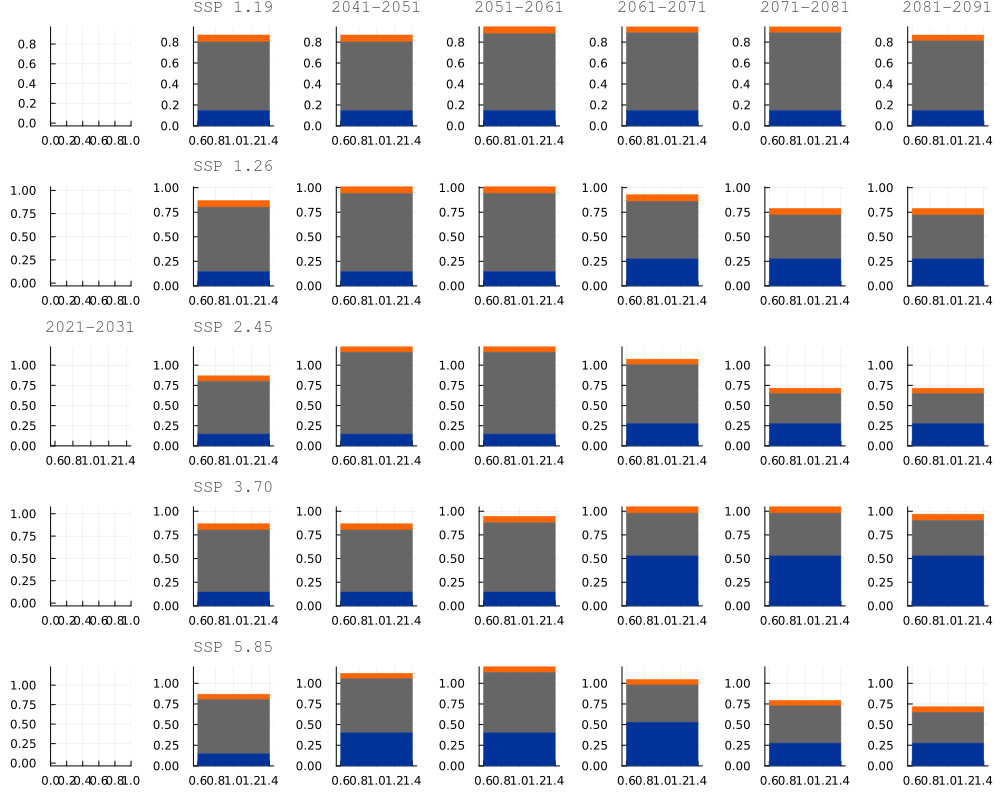

--1 (-)
  --2 (ssp119)
    --7 (ssp119)
      --12 (ssp119)
        --17 (ssp119)
          --22 (ssp119)
            --27 (ssp119)
  --3 (ssp126)
    --8 (ssp126)
      --13 (ssp126)
        --18 (ssp126)
          --23 (ssp126)
            --28 (ssp126)
  --4 (ssp245)
    --9 (ssp245)
      --14 (ssp245)
        --19 (ssp245)
          --24 (ssp245)
            --29 (ssp245)
  --5 (ssp370)
    --10 (ssp370)
      --15 (ssp370)
        --20 (ssp370)
          --25 (ssp370)
            --30 (ssp370)
  --6 (ssp585)
    --11 (ssp585)
      --16 (ssp585)
        --21 (ssp585)
          --26 (ssp585)
            --31 (ssp585)

JuDGE Expansions
Node 1: "invest[Geothermal]" 0.013306168004086199
Node 1: "invest[Boiler]" 0.7281507659423299
Node 1: "invest[HeatPump]" 0.02928446827306426
Node 7: "invest[Boiler]" 0.0866640833808594
Node 12: "invest[Geothermal]" 0.01126288564581623
Node 12: "invest[Boiler]" 0.738798901146277
Node 12: "invest[HeatPump]" 0.02928446827306419
Node 3: "invest[Boiler]" 

In [1013]:
function plot_node_results(judy, mytree)
    # Get solution and node
    solution = JuDGE.solution_to_dictionary(judy)
    
    depth = length(periods)
    if depth == 1  
        layout = (1, 1)
    else
        n = length(paths)  
        layout = (n, depth)
    end
    
    p = plot(layout=layout, 
            size=(1000, 800), 
            legend=:topright,
            link = :y
    )
    
    for (i, pos) in enumerate(get_all_node_positions())
        node = JuDGE.get_node(mytree, pos)
        short_sol = solution[node]

        depth = length(pos)
        # Get subplot position in grid
        if depth == 1
            row = Int(ceil(length(paths)/2))
            col = 1
            path = " Now"
            sp = (row-1)*(layout[2]) + col 
        else
            row = pos[2]
            col = length(pos) 
            sp = (row-1)*(layout[2]) + col 

            path = paths[pos[2]]
        end
        
        # Plot heating
        plot_heating_cooling!(p,sp, solution, pos)

        if row == 1 || col == 1
        # Add title with node position
            title!(p[sp], "$(periods[col])",
                    titlefont = font(9,"Arial"))
        end
        if col == 2
        # Add title with node position
            title!(p[sp], "SSP $(path[end-2]).$(path[end-1:end])",
                    titlefont = font(9,"Arial"))
        end
        if col == 10
        # Add title with node position
            plot!(p[sp], legend = :outerright)
        end
    end
    
    return p
end

function get_all_node_positions()
    res = Vector()
    for period in 1:length(periods)
        for ssp in 1:length(paths)
            
            if period == 1
                node_position = [1]
                push!(res,node_position)
            elseif period == 2
                node_position = [1,ssp]
                push!(res,node_position)
            else
                node_position = vcat([1,ssp],repeat([1], outer = [period - 2]))
                push!(res,node_position)
            end
            if period == 1
                break
            end
        end
    end
    return res
end

function plot_heating_cooling!(p,sp, solution, node_position)
    node = JuDGE.get_node(mytree, node_position)
    short_sol = solution[node]
    
    df_dict = Dict()
    multiplier = Dict(
        :Geothermal => 5,
        :HeatPump => 5,
        :Boiler => 0.9
    )
    for tech in H_assets
        df_dict[tech] = multiplier[tech]*short_sol[:invest_cumulative]["$(tech)"]
    end
    
    df = DataFrame(df_dict)
    tech_columns = [tech for tech in H_assets]
    data_matrix = Matrix(df[:, [tech_columns...]])
    
    num_techs = length(H_assets)
    
    green_colors = [Assets_colors[tech] for tech in H_assets]
    

    labels = reshape(vcat([string(tech) for tech in H_assets]), 1, :)
    colors = reshape(vcat(green_colors), 1, :)  # Red for unmet demand
    
    groupedbar!(
        data_matrix,
        bar_position = :stack,
        labels        = labels,
        color        = colors,
        linecolor   = colors,
        linewidth    = 0.5,
        legend = false,
        subplot      = sp,
    )

end


p = plot_node_results(judy, mytree)
display(p)
savefig(p, "size_installed.pdf")
JuDGE.print_tree(mytree,ssp)
JuDGE.print_expansions(judy)
JuDGE.write_solution_to_file(judy,joinpath(@__DIR__,"knapsack_solution.csv"))

[0.0 0.0 0.0 0.0; 0.0 0.0 6.612141921547027e-7 0.0; 0.0 0.0 0.015547714233397875 0.0; 0.0 0.0 0.03084172566731725 0.0; 0.0 0.0 0.04587875366210875 0.0; 0.0 0.0 0.0607692972819005 0.0; 0.0 0.0 0.07578445434570251 0.0; 0.0 0.0 0.09087005615234325 0.0; 0.0 0.0 0.10595718383788999 0.0; 0.0 0.0 0.121185455322265 0.0; 0.0 0.0 0.13662137349446551 0.0; 0.0 0.0 0.152301177978515 0.0; 0.0 0.0 0.1686433410644525 0.0; 0.0 0.0 0.18560399373372347 0.0; 0.0 0.0 0.20304644266764274 0.0; 0.17579629009343206 0.0 0.0446280059677652 0.0; 0.16968217779551248 0.06885442803944802 0.0 0.0; 0.1632335284909723 0.09598166112491271 0.0 0.0; 0.0 0.2841512298583975 0.0 0.0; 0.0 0.3196834818522125 0.0 0.0; 0.0 0.373728459676105 0.0 0.0; 0.0 0.0 0.0 0.7957414245605475]
RGB{Float64}[RGB(0.98, 0.4, 0.02), RGB(0.4, 0.4, 0.4), RGB(0.01, 0.2, 0.6)]
["Geothermal" "Boiler" "HeatPump" "Unmet Demand"]

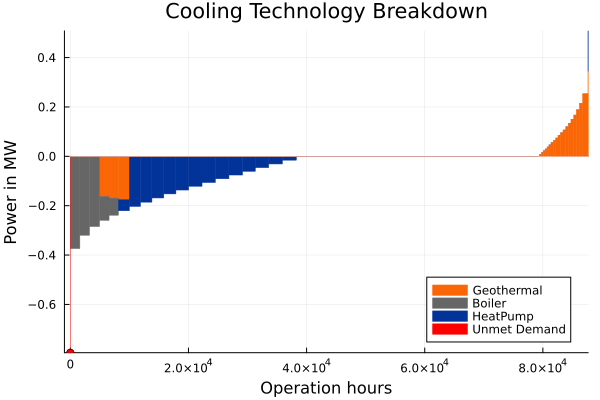

"/home/vub-flow/Documents/Code JuDGE/example operation.pdf"

In [1014]:
using DataFrames
using Plots
using StatsPlots

function plot_technology_breakdown(node, solution)
    short_sol = solution[node]
    HDH = filter(x -> x["variable"] == "HDH", degree_hour[node])
    CDH = filter(x -> x["variable"] == "CDH", degree_hour[node])

    
    H_keys = sort(unique([parse(Int64, split(k, ",")[2]) for k in keys(short_sol[:H_heat_prod])]))
    C_keys = sort(unique([parse(Int64, split(k, ",")[2]) for k in keys(short_sol[:C_heat_prod])]))

    H_unmet_values = [short_sol[:H_heat_unmet]["$(key)"] for key in H_keys]
    C_unmet_values = [short_sol[:C_heat_unmet]["$(key)"] for key in C_keys]
    
    H_tech_prod_values = Dict()
    for tech in H_assets
        H_tech_prod_values[tech] = [short_sol[:H_heat_prod]["$(tech),$(key)"] for key in H_keys]
    end
    C_tech_prod_values = Dict()
    for tech in C_assets
        C_tech_prod_values[tech] = [short_sol[:C_heat_prod]["$(tech),$(key)"] for key in C_keys]
    end
    
    H_hours = Array(HDH[!,"count"])
    H_cum_hours = cumsum(H_hours)
    C_hours = Array(CDH[!,"count"])
    C_cum_hours = cumsum(C_hours)
    
    df_dict = Dict(:Keys => H_keys, :H_heat_unmet => H_unmet_values)
    for tech in H_assets
        df_dict[tech] = H_tech_prod_values[tech]
    end
    
    df = DataFrame(df_dict)
    
    tech_columns = [tech for tech in H_assets]
    data_matrix = Matrix(df[:, [tech_columns..., :H_heat_unmet]])
    println(data_matrix)
    
        
    if sum(H_unmet_values*1000) < 1
        unmet_color = RGB(1,1,1)
    else
        unmet_color = RGB(1,0,0)
    end
    
    num_techs = length(H_assets)
    green_colors = [Assets_colors[tech] for tech in H_assets]
    println(green_colors)
    colors = reshape(vcat(green_colors, [unmet_color]), 1, :)  # Red for unmet demand
    
    labels = reshape(vcat([string(tech) for tech in H_assets], ["Unmet Demand"]), 1, :)
    print(labels)
    
    p = groupedbar(
        reverse(cumsum(reverse(H_hours))) .- H_hours/2,          # shifted x-positions
        -data_matrix,
        bar_position = :stack,
        bar_width    = (H_hours),
        labels        = labels,
        xlabel       = "Fraction of time",
        ylabel       = "Power",
        title        = "Heating Technology Breakdown",
        color        = colors,
        linecolor   = colors,
        xlims        = (0, H_cum_hours[end]),
        linewidth    = 0.5,
        legend = :topright
    )
    
    # COOLING
    if sum(data_matrix[end,:]) > 0
        scatter!(((reverse(cumsum(reverse(H_hours))) .- H_hours/2)[end], 
                -sum(data_matrix[end,:])),
                markershape=:circle, label="", color = "red")
    end
    
    df_dict = Dict(:Keys => C_keys, :C_heat_unmet => C_unmet_values)
    for tech in C_assets
        df_dict[tech] = C_tech_prod_values[tech]
    end
    
    df = DataFrame(df_dict)
    
    tech_columns = [tech for tech in C_assets]
    data_matrix = Matrix(df[:, [tech_columns..., :C_heat_unmet]])

    if sum(C_unmet_values*1000) < 0
        unmet_color = RGB(1,1,1)
    else
        unmet_color = RGB(1,0,0)
    end
    num_techs = length(C_assets)
    blue_colors = [Assets_colors[tech] for tech in C_assets]
    colors = reshape(vcat(blue_colors, [unmet_color]), 1, :)  # Red for unmet demand


    
    labels = reshape(vcat(["" for tech in C_assets], [""]), 1, :)
    
    p = groupedbar!(
        cumsum((C_hours)) .- C_hours/2,
        data_matrix,
        bar_position = :stack,
        bar_width    = (C_hours),
        label        = labels,
        xlabel       = "Operation hours",
        ylabel       = "Power in MW",
        title        = "Cooling Technology Breakdown",
        color        = colors,
        linecolor   = colors,
        xlims        = (-1000, C_cum_hours[end]),
        linewidth    = 0.5,
        legend = :bottomright
    )
    
    return p
end


# Usage:
p = plot_technology_breakdown(node, solution)
display(p)
# plot_cooling_technology_breakdown(node, solution)

savefig(p, "example operation.pdf")


RGB{Float64}[RGB(0.98, 0.4, 0.02), RGB(0.4, 0.4, 0.4), RGB(0.01, 0.2, 0.6)]3.5735773092641443
RGB{Float64}[RGB(0.98, 0.4, 0.02), RGB(0.4, 0.4, 0.4), RGB(0.01, 0.2, 0.6)]0.0
RGB{Float64}[RGB(0.98, 0.4, 0.02), RGB(0.4, 0.4, 0.4), RGB(0.01, 0.2, 0.6)]0.0
RGB{Float64}[RGB(0.98, 0.4, 0.02), RGB(0.4, 0.4, 0.4), RGB(0.01, 0.2, 0.6)]0.0
RGB{Float64}[RGB(0.98, 0.4, 0.02), RGB(0.4, 0.4, 0.4), RGB(0.01, 0.2, 0.6)]0.0
RGB{Float64}[RGB(0.98, 0.4, 0.02), RGB(0.4, 0.4, 0.4), RGB(0.01, 0.2, 0.6)]0.0
RGB{Float64}[RGB(0.98, 0.4, 0.02), RGB(0.4, 0.4, 0.4), RGB(0.01, 0.2, 0.6)]0.0
RGB{Float64}[RGB(0.98, 0.4, 0.02), RGB(0.4, 0.4, 0.4), RGB(0.01, 0.2, 0.6)]0.0
RGB{Float64}[RGB(0.98, 0.4, 0.02), RGB(0.4, 0.4, 0.4), RGB(0.01, 0.2, 0.6)]0.0
RGB{Float64}[RGB(0.98, 0.4, 0.02), RGB(0.4, 0.4, 0.4), RGB(0.01, 0.2, 0.6)]0.0
RGB{Float64}[RGB(0.98, 0.4, 0.02), RGB(0.4, 0.4, 0.4), RGB(0.01, 0.2, 0.6)]0.7957414245605475
RGB{Float64}[RGB(0.98, 0.4, 0.02), RGB(0.4, 0.4, 0.4), RGB(0.01, 0.2, 0.6)]0.0
RGB{Float64}[RGB(0.98,

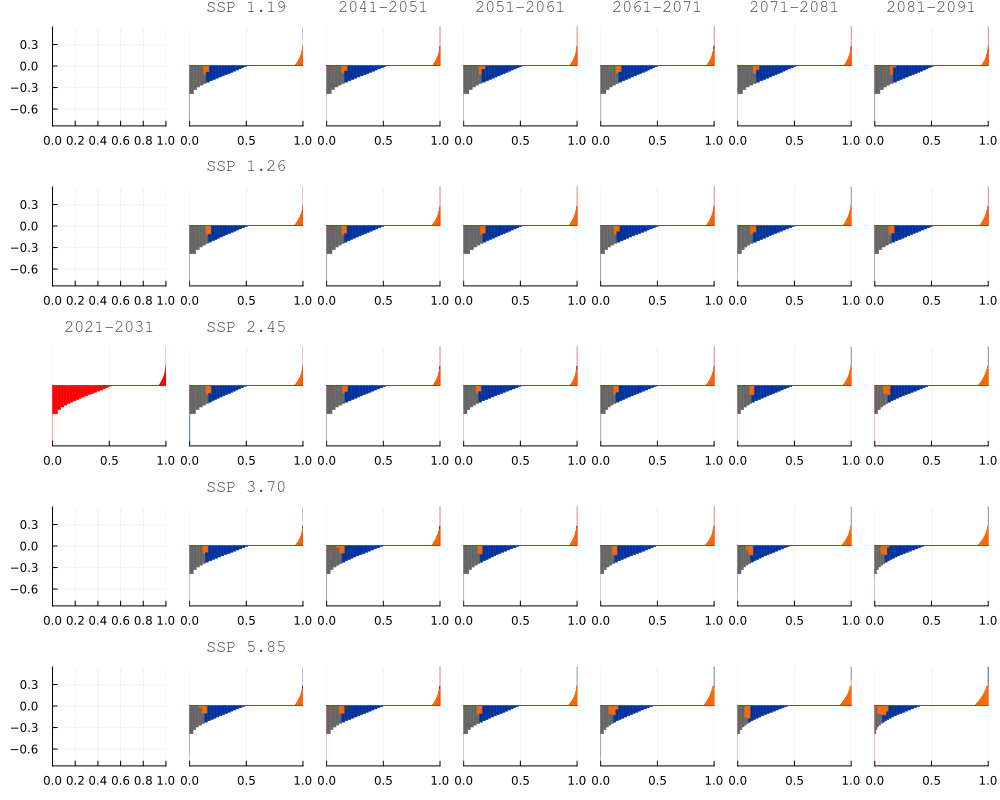

"/home/vub-flow/Documents/Code JuDGE/dummy_results.pdf"

In [1015]:

beg_frac_x = -0.0
end_frac_x = 1.0
incr_frac_x = 1.0/2
function plot_node_results(judy, mytree)
    # Get solution and node
    solution = JuDGE.solution_to_dictionary(judy)
    
    # Determine layout based on node position
    depth = length(periods)
    if depth == 1  # Root node
        layout = (1, 1)
    else
        n = length(paths)  # Number of branches at first level
        layout = (n, depth)
    end
    
    # Create plot grid
    p = plot(layout=layout, 
            size=(1000, 800), 
            legend=:topright,
            link = :y
    )
    
    # Plot heating and cooling for each subnode
    for (i, pos) in enumerate(get_all_node_positions())
        node = JuDGE.get_node(mytree, pos)
        short_sol = solution[node]

        depth = length(pos)
        # Get subplot position in grid
        if depth == 1
            row = Int(ceil(length(paths)/2))
            col = 1
            path = " Now"
            sp = (row-1)*(layout[2]) + col 
        else
            row = pos[2]
            col = length(pos) 
            sp = (row-1)*(layout[2]) + col 

            path = paths[pos[2]]
        end
        
        # Plot heating
        plot_heating_cooling!(p,sp, solution, pos)

        if row == 1 || col == 1
        # Add title with node position
            title!(p[sp], "$(periods[col])",
                    titlefont = font(9,"Arial"))
        end
        if col == 2
        # Add title with node position
            title!(p[sp], "SSP $(path[end-2]).$(path[end-1:end])",
                    titlefont = font(9,"Arial"))
        end
        if col == 10
        # Add title with node position
            plot!(p[sp], legend = :outerright)
        end
    end
    
    return p
end

function get_all_node_positions()
    res = Vector()
    for period in 1:length(periods)
        for ssp in 1:length(paths)
            
            if period == 1
                node_position = [1]
                push!(res,node_position)
            elseif period == 2
                node_position = [1,ssp]
                push!(res,node_position)
            else
                node_position = vcat([1,ssp],repeat([1], outer = [period - 2]))
                push!(res,node_position)
            end
            if period == 1
                break
            end
        end
    end
    return res
end

function plot_heating_cooling!(p,sp, solution, node_position)
    node = JuDGE.get_node(mytree, node_position)
    short_sol = solution[node]
    heating = true
    cooling = true
    if heating
        HDH = filter(x -> x["variable"] == "HDH", degree_hour[node])

        H_keys = sort(unique([parse(Int64, split(k, ",")[2]) for k in keys(short_sol[:H_heat_prod])]))
    
        H_unmet_values = [short_sol[:H_heat_unmet]["$(key)"] for key in H_keys]
        
        H_tech_prod_values = Dict()
        for tech in H_assets
            H_tech_prod_values[tech] = [short_sol[:H_heat_prod]["$(tech),$(key)"] for key in H_keys]
        end
        
        H_hours = Array(HDH[!,"count"])
        H_cum_hours = cumsum(H_hours)
        
        df_dict = Dict(:Keys => H_keys, :H_heat_unmet => H_unmet_values)
        for tech in H_assets
            df_dict[tech] = H_tech_prod_values[tech]
        end
        
        df = DataFrame(df_dict)
        
        tech_columns = [tech for tech in H_assets]
        data_matrix = Matrix(df[:, [tech_columns..., :H_heat_unmet]])
        
        num_techs = length(H_assets)
        
        green_colors = [Assets_colors[tech] for tech in H_assets]
        print(green_colors)
        
        if sum(H_unmet_values) < 1
            unmet_color = RGB(1,1,1)
        else
            unmet_color = RGB(1,0,0)
        end
        unmet_color = RGB(1,0,0)

        labels = reshape(vcat([string(tech) for tech in H_assets], [""]), 1, :)
        println(sum(H_unmet_values))
        colors = reshape(vcat(green_colors, [unmet_color]), 1, :)  # Red for unmet demand
        
        groupedbar!(
            reverse(cumsum(reverse(H_hours))) .- H_hours/2,          # shifted x-positions
            -data_matrix,
            bar_position = :stack,
            bar_width    = (H_hours),
            labels        = labels,
            # xlabel       = "Fraction of time",
            # ylabel       = "Power",
            color        = colors,
            linecolor   = colors,
            xlims        = (beg_frac_x,end_frac_x).*H_cum_hours[end],
            xticks       = ((beg_frac_x:incr_frac_x:end_frac_x).*H_cum_hours[end], (beg_frac_x:incr_frac_x:end_frac_x)),
            linewidth    = 0.5,
            legend = false,
            subplot      = sp,
            yaxis = false,
        )
        end

    if cooling
        # Extract keys and sort them
        CDH = filter(x -> x["variable"] == "CDH", degree_hour[node])
        C_keys = sort(unique([parse(Int64, split(k, ",")[2]) for k in keys(short_sol[:C_heat_prod])]))
        
        # Prepare data for plotting
        C_unmet_values = [short_sol[:C_heat_unmet]["$(key)"] for key in C_keys]
        C_tech_prod_values = Dict()
        for tech in C_assets
            C_tech_prod_values[tech] = [short_sol[:C_heat_prod]["$(tech),$(key)"] for key in C_keys]
        end
        C_hours = Array(CDH[!,"count"])
        C_cum_hours = cumsum(C_hours)
        
        df_dict = Dict(:Keys => C_keys, :C_heat_unmet => C_unmet_values)
        for tech in C_assets
            df_dict[tech] = C_tech_prod_values[tech]
        end
        
        df = DataFrame(df_dict)
        
        tech_columns = [tech for tech in C_assets]
        data_matrix = Matrix(df[:, [tech_columns..., :C_heat_unmet]])
    
        num_techs = length(C_assets)
        blue_colors = [Assets_colors[tech] for tech in C_assets]
        
        if sum(C_unmet_values) < 1
            unmet_color = RGB(1,1,1)
        else
            unmet_color = RGB(1,0,0)
        end
        unmet_color = RGB(1,0,0)
        colors = reshape(vcat(blue_colors, [unmet_color]), 1, :)  # Red for unmet demand
    
        labels = reshape(vcat([string(tech) for tech in C_assets], ["Unmet demand"]), 1, :)
        
        groupedbar!(
            cumsum((C_hours)) .- C_hours/2,
            data_matrix,
            bar_position = :stack,
            bar_width    = (C_hours),
            label        = labels,
            # xlabel       = "Fraction of time",
            # ylabel       = "Power",
            yticks = ([],[]),
            color        = colors,
            linecolor   = colors,
            linewidth    = 0.5,
            legend=false, 
            xlims        = (beg_frac_x,end_frac_x).*C_cum_hours[end],
            xticks       = ((beg_frac_x:incr_frac_x:end_frac_x).*C_cum_hours[end], (beg_frac_x:incr_frac_x:end_frac_x)),
            # legend = :topright,
            subplot      = sp 
        )
        
        # groupedbar!(
        #     cumsum(C_hours) .- C_hours/2,          # shifted x-positions
        #     data_matrix,
        #     bar_position = :stack,
        #     bar_width    = (C_hours),
        #     label        = ["" ""],
        #     # xlabel       = "Fraction of time",
        #     # ylabel       = "Power",
        #     # title        = "Heating and cooling demand",
        #     color       = ["red" "green"],
        #     linecolor   = ["red" "green"],
        #     xlims        = (beg_frac_x,end_frac_x).*C_cum_hours[end],
        #     xticks       = ((beg_frac_x:incr_frac_x:end_frac_x).*C_cum_hours[end], (beg_frac_x:incr_frac_x:end_frac_x)),
        #     subplot      = sp 
        # )
    end
end


p = plot_node_results(judy, mytree)
display(p)
savefig(p, "dummy_results.pdf")

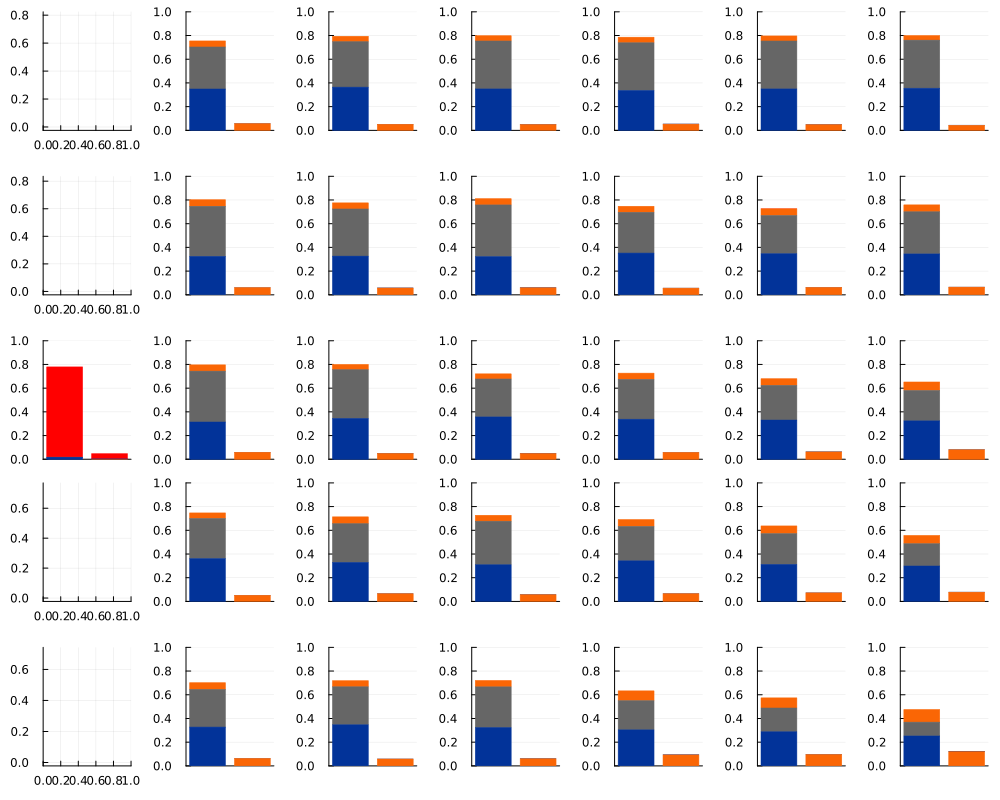

"/home/vub-flow/Documents/Code JuDGE/generated_energy.pdf"

In [901]:

function plot_node_results(judy, mytree)
    # Get solution and node
    solution = JuDGE.solution_to_dictionary(judy)
    
    # Determine layout based on node position
    depth = length(periods)
    if depth == 1  # Root node
        layout = (1, 1)
    else
        n = length(paths)  # Number of branches at first level
        layout = (n, depth)
    end
    
    # Create plot grid
    p = plot(layout=layout, 
            size=(1000, 800), 
            legend=:topright,
            link = :y
    )
    
    # Plot heating and cooling for each subnode
    for (i, pos) in enumerate(get_all_node_positions())
        node = JuDGE.get_node(mytree, pos)
        short_sol = solution[node]

        depth = length(pos)
        # Get subplot position in grid
        if depth == 1
            row = Int(ceil(length(paths)/2))
            col = 1
            path = " Now"
            sp = (row-1)*(layout[2]) + col 
        else
            row = pos[2]
            col = length(pos) 
            sp = (row-1)*(layout[2]) + col 

            path = paths[pos[2]]
        end
        
        # Plot heating
        plot_heating_cooling!(p,sp, solution, pos)
        
        # Add title with node position
        # title!(p[sp], "$(periods[col])\nSSP $(path[end-2]).$(path[end-1:end])",
        #         titlefont = font(9,"Arial"))
    end
    
    return p
end

function get_all_node_positions()
    res = Vector()
    for period in 1:length(periods)
        for ssp in 1:length(paths)
            
            if period == 1
                node_position = [1]
                push!(res,node_position)
            elseif period == 2
                node_position = [1,ssp]
                push!(res,node_position)
            else
                node_position = vcat([1,ssp],repeat([1], outer = [period - 2]))
                push!(res,node_position)
            end
            if period == 1
                break
            end
        end
    end
    return res
end

function plot_heating_cooling!(p,sp, solution, node_position)
    node = JuDGE.get_node(mytree, node_position)
    short_sol = solution[node]
    heating = true
    cooling = true
    if heating
        HDH = filter(x -> x["variable"] == "HDH", degree_hour[node])
        H_hours = Array(HDH[!,"count"])

        H_keys = sort(unique([parse(Int64, split(k, ",")[2]) for k in keys(short_sol[:H_heat_prod])]))
    
        H_unmet_values = sum([short_sol[:H_heat_unmet]["$(key)"]*H_hours[key] for key in H_keys])

        H_tech_prod_values = Dict()
        for tech in H_assets
            H_tech_prod_values[tech] = sum([short_sol[:H_heat_prod]["$(tech),$(key)"]*H_hours[key] for key in H_keys])
        end
        
        df_dict = Dict(:Keys => ["Heating"], :H_heat_unmet => H_unmet_values)
        for tech in H_assets
            df_dict[tech] = H_tech_prod_values[tech]
        end
        
        df = DataFrame(df_dict)
        tech_columns = [tech for tech in H_assets]
        data_matrix = Matrix(df[:, [:H_heat_unmet,tech_columns...]])
        
        num_techs = length(H_assets)
        green_colors = [Assets_colors[tech] for tech in H_assets]
        
        
        if sum(H_unmet_values) < 1e-3
            unmet_color = RGB(1,1,1)
        else
            unmet_color = RGB(1,0,0)
        end
        colors = reshape(vcat([unmet_color],green_colors), 1, :)  # Red for unmet demand
        
        groupedbar!(
            [1],          # shifted x-positions
            data_matrix/(10*1e3),
            bar_position = :stack,
            color        = colors,
            linecolor   = colors,
            linewidth    = 0.5,
            legend = false,
            subplot      = sp 
        )
    #     end

    if cooling
        # Extract keys and sort them
        CDH = filter(x -> x["variable"] == "CDH", degree_hour[node])
        C_hours = Array(CDH[!,"count"])
        C_keys = sort(unique([parse(Int64, split(k, ",")[2]) for k in keys(short_sol[:C_heat_prod])]))
        
        # Prepare data for plotting
        C_unmet_values = sum([short_sol[:C_heat_unmet]["$(key)"]*C_hours[key] for key in C_keys])
        C_tech_prod_values = Dict()
        for tech in C_assets
            C_tech_prod_values[tech] = sum([short_sol[:C_heat_prod]["$(tech),$(key)"]*C_hours[key] for key in C_keys])
        end
        
        df_dict = Dict(:Keys => ["Cooling"], :C_heat_unmet => C_unmet_values)
        for tech in C_assets
            df_dict[tech] = C_tech_prod_values[tech]
        end
        
        df = DataFrame(df_dict)
        
        tech_columns = [tech for tech in C_assets]
        data_matrix = Matrix(df[:, [:C_heat_unmet,tech_columns...]])
    
        num_techs = length(C_assets)
        blue_colors = [Assets_colors[tech] for tech in C_assets]
        
        if sum(C_unmet_values) < 1e-3
            unmet_color = RGB(1,1,1)
        else
            unmet_color = RGB(1,0,0)
        end
            
        colors = reshape(vcat([unmet_color], blue_colors), 1, :)  # Red for unmet demand
    
        labels = reshape(vcat([string(tech) for tech in C_assets], ["Unmet demand"]), 1, :)
        
        groupedbar!(
            [2],
            data_matrix/(10*1e3),
            bar_position = :stack,
            color        = colors,
            linecolor   = colors,
            linewidth    = 0.5,
            legend=false, 
            ylims        = (0,1.0),
            xticks       = ([], []),
            xrotation = 45,
            subplot      = sp 
        )
        
        end
    end
end


p = plot_node_results(judy, mytree)
display(p)
savefig(p, "generated_energy.pdf")

cooling
cooling
cooling
cooling
cooling
cooling
cooling
cooling
cooling
cooling
cooling
cooling
cooling
cooling
cooling
cooling
cooling
cooling
cooling
cooling
cooling
cooling
cooling
cooling
cooling
cooling
cooling
cooling
cooling
cooling
cooling


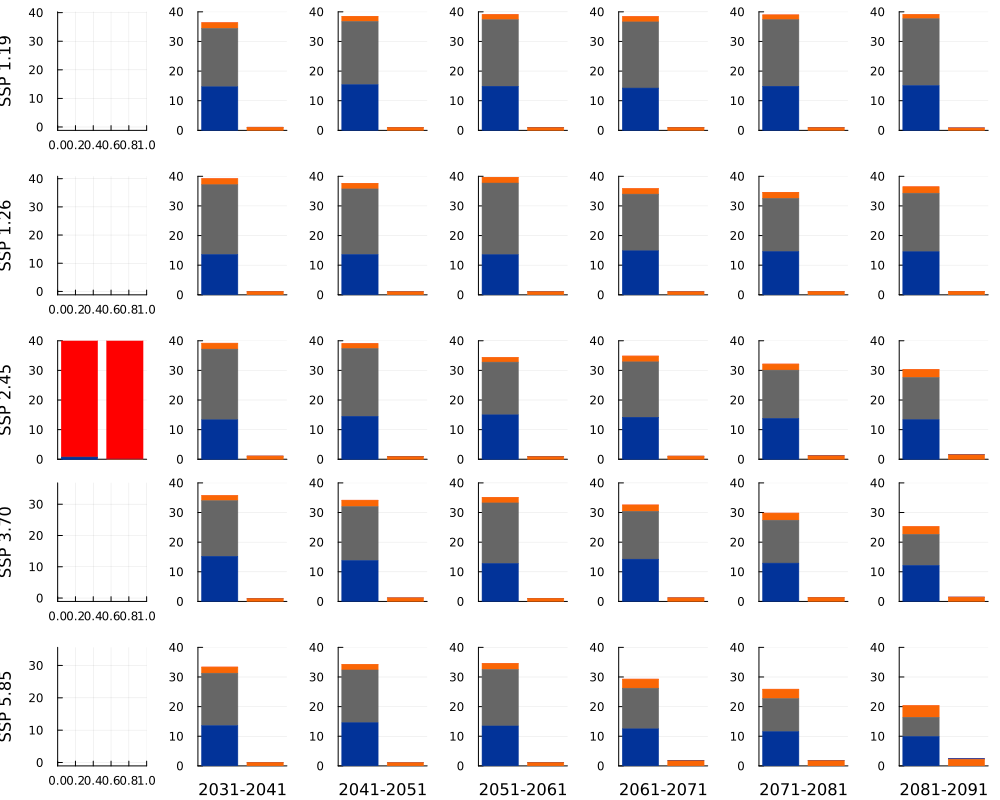

"/home/vub-flow/Documents/Code JuDGE/prices.pdf"

In [902]:
function plot_node_results(judy, mytree)
    # Get solution and node
    solution = JuDGE.solution_to_dictionary(judy)
    
    # Determine layout based on node position
    depth = length(periods)
    if depth == 1  # Root node
        layout = (1, 1)
    else
        n = length(paths)  # Number of branches at first level
        layout = (n, depth)
    end
    
    # Create plot grid
    p = plot(layout=layout, 
            size=(1000, 800), 
            legend=:topright,
            link = :y
    )
    
    # Plot heating and cooling for each subnode
    for (i, pos) in enumerate(get_all_node_positions())
        node = JuDGE.get_node(mytree, pos)
        short_sol = solution[node]

        depth = length(pos)
        # Get subplot position in grid
        if depth == 1
            row = Int(ceil(length(paths)/2))
            col = 1
            path = " Now"
            sp = (row-1)*(layout[2]) + col 
        else
            row = pos[2]
            col = length(pos) 
            sp = (row-1)*(layout[2]) + col 

            path = paths[pos[2]]
        end
        
        # Plot heating
        plot_heating_cooling!(p,sp, solution, pos)


        if row == 5
            plot!(p[sp], xlabel       = "$(periods[col])",
                    titlefont = font(9,"Arial"))
        end
    end

    for row in 1:5
        col = 1
        path = paths[row]
        sp = (row-1)*(layout[2]) + col 
        plot!(p[sp], ylabel="SSP $(path[end-2]).$(path[end-1:end])",
              linewidth=2, color=:red)

    end
    
    return p
end

function get_all_node_positions()
    res = Vector()
    for period in 1:length(periods)
        for ssp in 1:length(paths)
            
            if period == 1
                node_position = [1]
                push!(res,node_position)
            elseif period == 2
                node_position = [1,ssp]
                push!(res,node_position)
            else
                node_position = vcat([1,ssp],repeat([1], outer = [period - 2]))
                push!(res,node_position)
            end
            if period == 1
                break
            end
        end
    end
    return res
end

function plot_heating_cooling!(p,sp, solution, node_position)
    node = JuDGE.get_node(mytree, node_position)
    short_sol = solution[node]
    heating = true
    cooling = true

    if heating
        HDH = filter(x -> x["variable"] == "HDH", degree_hour[node])
        H_hours = Array(HDH[!,"count"])

        H_keys = sort(unique([parse(Int64, split(k, ",")[2]) for k in keys(short_sol[:H_heat_prod])]))
    
        H_unmet_values = sum([c_unmet * short_sol[:H_heat_unmet]["$(key)"]*H_hours[key] for key in H_keys])

        H_tech_prod_values = Dict()
        for tech in H_assets
            H_tech_prod_values[tech] = sum([short_sol[:H_heat_prod]["$(tech),$(key)"]*H_hours[key]/efficiency_H[tech](HDH[key,"quantile"]) * primary_cost[prim[tech]] for key in H_keys])
            
        end
        
        df_dict = Dict(:Keys => ["Heating"], :H_heat_unmet => H_unmet_values)
        for tech in H_assets
            df_dict[tech] = H_tech_prod_values[tech]
        end
        
        df = DataFrame(df_dict)
        tech_columns = [tech for tech in (H_assets)]
        data_matrix = Matrix(df[:, [:H_heat_unmet, tech_columns...]])
        
        num_techs = length(H_assets)
        green_colors = [Assets_colors[tech] for tech in H_assets]
        
        
        unmet_color = RGB(1,0,0)
            
        colors = reshape(vcat([unmet_color], green_colors), 1, :)  # Red for unmet demand
        
        labels = reshape(vcat([string(tech) for tech in H_assets], [""]), 1, :)
        
        groupedbar!(
            [1],          # shifted x-positions
            data_matrix/(10*1e3),
            bar_position = :stack,
            # bar_width    = (H_hours),
            labels        = labels,
            # xlabel       = "Fraction of time",
            # ylabel       = "Power",
            color        = colors,
            linecolor   = colors,
            # xlims        = (beg_frac_x,end_frac_x).*H_cum_hours[end],
            # xticks       = ((beg_frac_x:incr_frac_x:end_frac_x).*H_cum_hours[end], (beg_frac_x:incr_frac_x:end_frac_x)),
            legend = false,
            linewidth    = 0.5,
            subplot      = sp 
        )
    end

    if cooling
        # Extract keys and sort them
        CDH = filter(x -> x["variable"] == "CDH", degree_hour[node])
        C_hours = Array(CDH[!,"count"])
        C_keys = sort(unique([parse(Int64, split(k, ",")[2]) for k in keys(short_sol[:C_heat_prod])]))
        
        # Prepare data for plotting
        C_unmet_values = sum([c_unmet * short_sol[:C_heat_unmet]["$(key)"]*C_hours[key] for key in C_keys])
        C_tech_prod_values = Dict()
        for tech in C_assets
            C_tech_prod_values[tech] = sum([short_sol[:C_heat_prod]["$(tech),$(key)"]*C_hours[key]/efficiency_C[tech](CDH[key,"quantile"]) * primary_cost[prim[tech]] for key in C_keys])
        end
        
        df_dict = Dict(:Keys => ["Cooling"], :C_heat_unmet => C_unmet_values)
        for tech in C_assets
            df_dict[tech] = C_tech_prod_values[tech]
        end
        df = DataFrame(df_dict)
        
        tech_columns = [tech for tech in C_assets]
        data_matrix = Matrix(df[:, [:C_heat_unmet, tech_columns...]])
    
        num_techs = length(C_assets)
        blue_colors = [Assets_colors[tech] for tech in C_assets]
        
        unmet_color = RGB(1,0,0)
            
        colors = reshape(vcat([unmet_color], blue_colors), 1, :)  # Red for unmet demand
    
        labels = reshape(vcat([string(tech) for tech in C_assets], ["Unmet demand"]), 1, :)
        
        groupedbar!(
            [2],
            data_matrix/(10*1e3),
            bar_position = :stack,
            # bar_width    = (C_hours),
            label        = labels,
            # xlabel       = "Fraction of time",
            # ylabel       = "Power",
            color        = colors,
            linecolor   = colors,
            linewidth    = 0.5,
            ylims        = (0,40),
            # xticks       = ([1,2], ["Heating","Cooling"]),
            xticks       = ([], []),
            xrotation = 45,
            legend = false,
            subplot      = sp 
        )
        println("cooling")
        
        # groupedbar!(
        #     cumsum(C_hours) .- C_hours/2,          # shifted x-positions
        #     data_matrix,
        #     bar_position = :stack,
        #     bar_width    = (C_hours),
        #     label        = ["" ""],
        #     # xlabel       = "Fraction of time",
        #     # ylabel       = "Power",
        #     # title        = "Heating and cooling demand",
        #     color       = ["red" "green"],
        #     linecolor   = ["red" "green"],
        #     xlims        = (beg_frac_x,end_frac_x).*C_cum_hours[end],
        #     xticks       = ((beg_frac_x:incr_frac_x:end_frac_x).*C_cum_hours[end], (beg_frac_x:incr_frac_x:end_frac_x)),
        #     subplot      = sp 
        # )
    end
end


p = plot_node_results(judy, mytree)
display(p)
savefig(p, "prices.pdf")